# Music and Machine Learning

### Librosa library and others
`pip install librosa`

`pip install mir_eval`

`pip install seaborn`

### Design Goals
* Low barrier to entry
* Consistency
* Compatibility
* Modularity
* Quality Control

## 1. Loading and visualizing audio

In [3]:
# Enable plots in the notebook
%matplotlib inline
import matplotlib.pyplot as plt

# seaborn makes plots prettier
import seaborn
seaborn.set(style='ticks')

# import the audio playback widget
from IPython.display import Audio

# other general libs
import numpy as np
import scipy
import mir_eval
import librosa

`load()` returns the audio and sampling rate

By default, all audio is resampled to 22KHZ mono

In [4]:
y, sr = librosa.load(librosa.util.example_audio_file())
print (type(y), type(sr))
print (y.shape, sr)

(<type 'numpy.ndarray'>, <type 'int'>)
((1355168,), 22050)


### Play the audio file

In [5]:
Audio(data=y, rate=sr)

### Plotting waveform

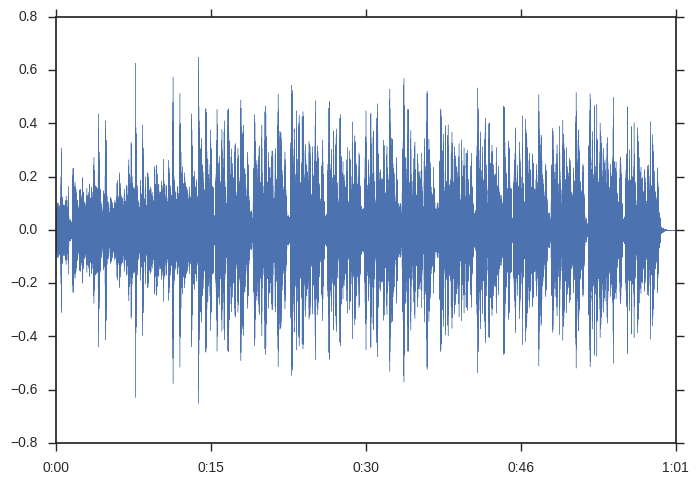

In [6]:
librosa.display.waveplot(y, sr)

## 2. Spectrograms

Spectrograms are stored as 2-dimensional numpy arrays.
The first axis is Frequency and second axis is Time.

* sr = sampling rate (Hz)
* frame = short audio clip (-spectrogram column)
* n_fft = samples per frame
* hop_length = # samples between frames

### Short-time Fourier transform

In [9]:
D = librosa.stft(y)

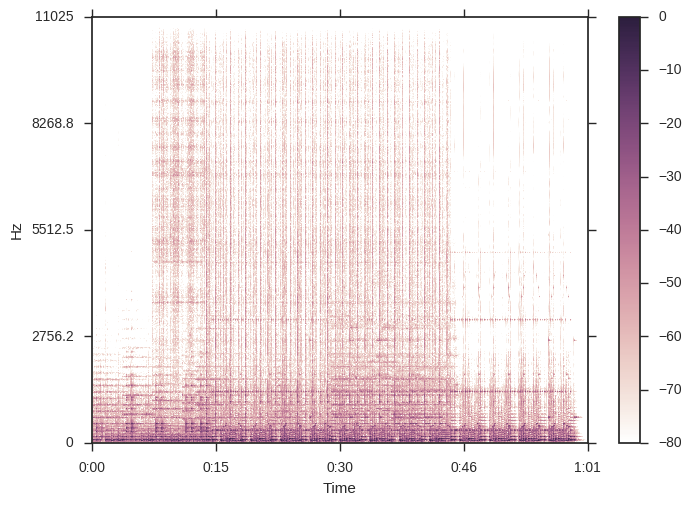

In [10]:
log_power = librosa.logamplitude(D**2, ref_power=np.max)

librosa.display.specshow(log_power, x_axis="time", y_axis="linear")
plt.colorbar();

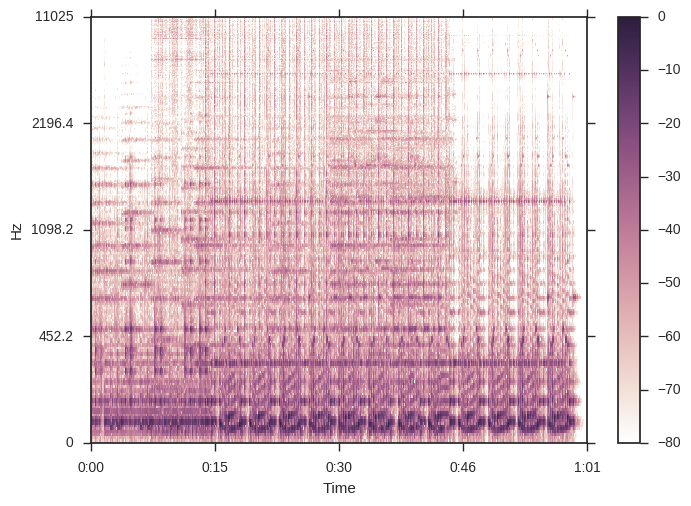

In [11]:
# log-frequency axis
librosa.display.specshow(log_power, x_axis="time", y_axis="log")
plt.colorbar();

### Constant Q transform

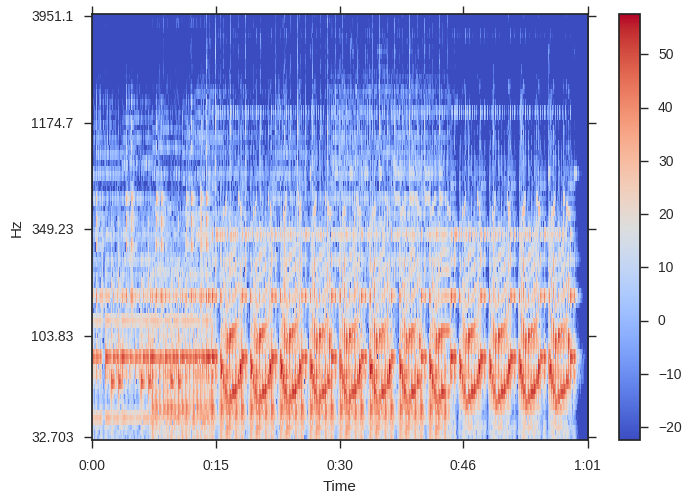

In [16]:
C = np.abs(librosa.cqt(y, sr, real=False))

librosa.display.specshow(librosa.logamplitude(C**2), x_axis="time", y_axis="cqt_hz")
plt.colorbar();

## 3. Pitch vs Pitch class

CQT measures the energy in each pitch
Chroma measures the energy in each pitch class

(12, 2647)


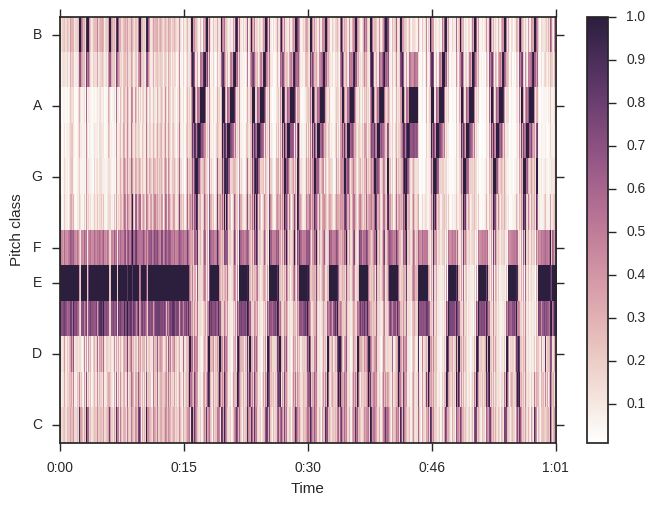

In [35]:
chroma = librosa.feature.chroma_cqt(C=C, sr=sr)
librosa.display.specshow(chroma, x_axis="time", y_axis="chroma")
plt.colorbar()
print (chroma.shape)

### Feature Extraction

In [36]:
M = librosa.feature.melspectrogram(y=y, sr=sr)
MFCC = librosa.feature.mfcc(y=y, sr=sr)
tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

print (M.shape)
print (MFCC.shape)
print (tonnetz.shape)

(128, 2647)
(20, 2647)
(6, 2647)


## 4. Audio Effects

In [24]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

In [25]:
Audio(data=y, rate=sr)

In [26]:
Audio(data=y_harmonic, rate=sr)

In [27]:
Audio(data=y_percussive, rate=sr)

## 5. Onsets and Beats

In [29]:
# onset strength envelope
onset_envelope = librosa.onset.onset_strength(y, sr)

# onset events
onsets = librosa.onset.onset_detect(onset_envelope=onset_envelope)

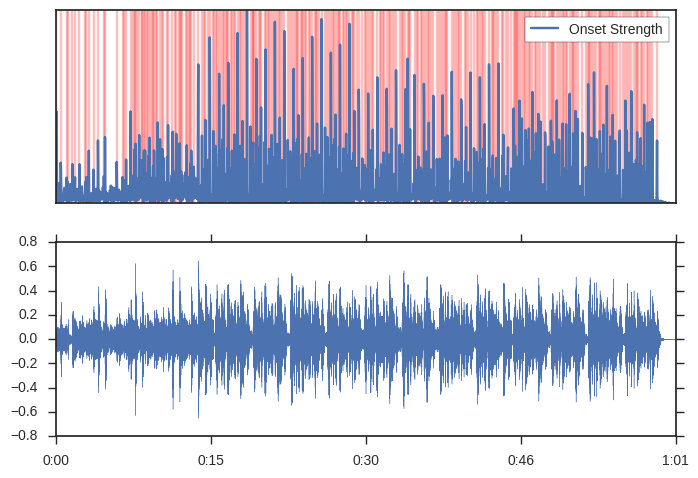

In [30]:
plt.subplot(2, 1, 1)
plt.plot(onset_envelope, label='Onset Strength')
plt.vlines(onsets, 0, onset_envelope.max(), color='r', alpha=0.25)
plt.xticks([]), plt.yticks([])
plt.legend(frameon=True)
plt.axis('tight')

plt.subplot(2, 1, 2)
librosa.display.waveplot(y, sr);

### Tempo and beats

In [31]:
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_envelope)

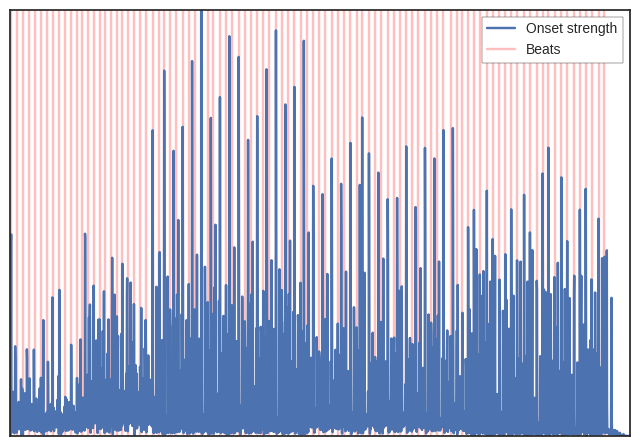

In [33]:
plt.plot(onset_envelope, label="Onset strength")
plt.vlines(beats, 0, onset_envelope.max(), color='r', alpha=0.25, label="Beats")
plt.xticks([]), plt.yticks([])
plt.legend(frameon=True)
plt.axis('tight');

In [34]:
beat_times = librosa.frames_to_time(beats)

y_click = mir_eval.sonify.clicks(beat_times, sr, length=len(y))

Audio(data=y + y_click, rate=sr)